In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from fbprophet import Prophet
from sklearn.metrics import mean_squared_error, mean_absolute_error
import warnings
warnings.simplefilter("ignore")

plt.style.use('bmh')

In [2]:
miguel = pd.read_csv("miguel_pm10_clean.csv",index_col=[1])
cuauh = pd.read_csv("cuauh_pm10_clean.csv",index_col=[1])
benito = pd.read_csv("benito_pm10_clean.csv",index_col=[1])

miguel.drop("Unnamed: 0",axis=1,inplace=True)
cuauh.drop("Unnamed: 0",axis=1,inplace=True)
benito.drop("Unnamed: 0",axis=1,inplace=True)

# fbprophet

In [3]:
miguel.dtypes

FECHA     object
HORA       int64
MGH      float64
AÑO        int64
MES        int64
dtype: object

In [4]:
miguel.head()

,FECHA,HORA,MGH,AÑO,MES
DATETIME,,,,,
2015-01-01 01:00:00,2015-01-01 00:00:00,1,165.0,2015,1
2015-01-01 02:00:00,2015-01-01 00:00:00,2,293.0,2015,1
2015-01-01 03:00:00,2015-01-01 00:00:00,3,266.0,2015,1
2015-01-01 04:00:00,2015-01-01 00:00:00,4,178.0,2015,1
2015-01-01 05:00:00,2015-01-01 00:00:00,5,146.0,2015,1


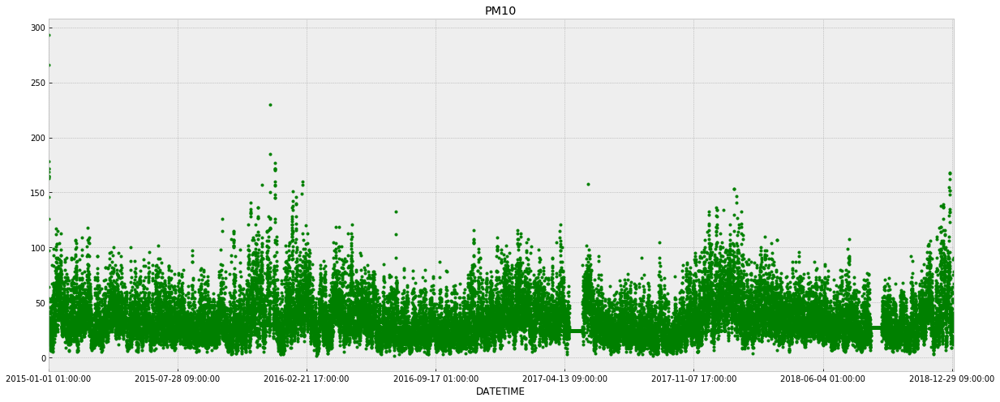

In [5]:
miguel.MGH.plot(style='.', figsize=(20, 8), color='g', title='PM10');

## Modelo A

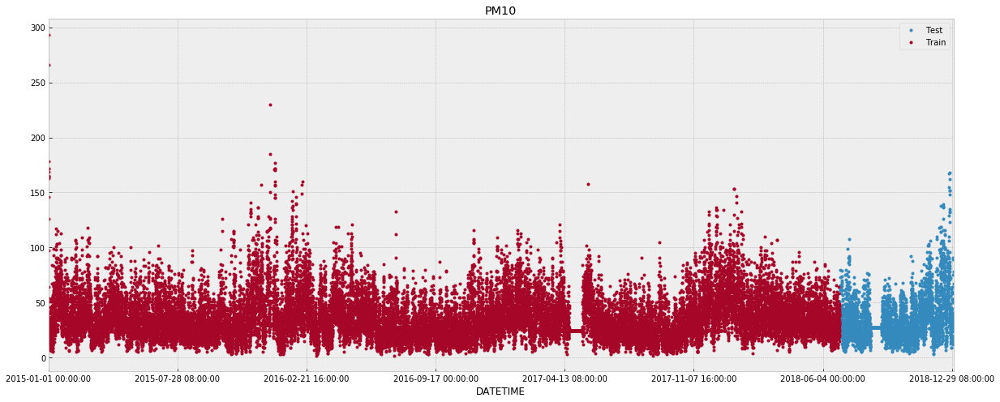

In [63]:
miguel_modelo= miguel.drop(["FECHA","HORA","AÑO","MES"],axis=1)
split_date='2018-06-31'

train=miguel_modelo[miguel_modelo.index<=split_date].copy()
test=miguel_modelo[miguel_modelo.index>split_date].copy()

test.rename(columns={'MGH': 'Test'})\
.join(train.rename(columns={'MGH': 'Train'}), how='outer')\
.plot(figsize=(20,8), title='PM10', style='.');

In [64]:
train=train.reset_index().rename(columns={'DATETIME':'ds','MGH':'y'})
test=test.reset_index().rename(columns={'DATETIME':'ds','MGH':'y'})
train.head()

,ds,y
0,2015-01-01 01:00:00,165.0
1,2015-01-01 02:00:00,293.0
2,2015-01-01 03:00:00,266.0
3,2015-01-01 04:00:00,178.0
4,2015-01-01 05:00:00,146.0


In [8]:
modelo=Prophet().fit(train)

In [9]:
pred=modelo.predict(test)

In [10]:
pred

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2018-01-01 00:00:00,43.240724,21.288711,62.197503,43.240724,43.240724,-2.365638,-2.365638,-2.365638,-8.281441,...,-3.424229,-3.424229,-3.424229,9.340032,9.340032,9.340032,0.0,0.0,0.0,40.875086
1,2018-01-01 01:00:00,43.242619,19.735996,61.500042,43.242619,43.242619,-2.890359,-2.890359,-2.890359,-9.086682,...,-3.141269,-3.141269,-3.141269,9.337593,9.337593,9.337593,0.0,0.0,0.0,40.352261
2,2018-01-01 02:00:00,43.244515,20.389457,60.632384,43.244515,43.244515,-3.150009,-3.150009,-3.150009,-9.637173,...,-2.848034,-2.848034,-2.848034,9.335197,9.335197,9.335197,0.0,0.0,0.0,40.094505
3,2018-01-01 03:00:00,43.246410,18.964503,61.660217,43.246410,43.246410,-2.958532,-2.958532,-2.958532,-9.744691,...,-2.546686,-2.546686,-2.546686,9.332845,9.332845,9.332845,0.0,0.0,0.0,40.287878
4,2018-01-01 04:00:00,43.248305,19.869790,61.298078,43.248305,43.248305,-2.046158,-2.046158,-2.046158,-9.137255,...,-2.239440,-2.239440,-2.239440,9.330537,9.330537,9.330537,0.0,0.0,0.0,41.202147
5,2018-01-01 05:00:00,43.250200,22.984506,63.782778,43.250200,43.250200,-0.099937,-0.099937,-0.099937,-7.499673,...,-1.928537,-1.928537,-1.928537,9.328273,9.328273,9.328273,0.0,0.0,0.0,43.150263
6,2018-01-01 06:00:00,43.252095,24.812278,68.204495,43.252095,43.252095,3.120938,3.120938,3.120938,-4.588889,...,-1.616226,-1.616226,-1.616226,9.326053,9.326053,9.326053,0.0,0.0,0.0,46.373033
7,2018-01-01 07:00:00,43.253991,30.983685,71.445202,43.253991,43.253991,7.573669,7.573669,7.573669,-0.445468,...,-1.304741,-1.304741,-1.304741,9.323877,9.323877,9.323877,0.0,0.0,0.0,50.827660
8,2018-01-01 08:00:00,43.255886,34.329035,76.590452,43.255886,43.255886,12.734785,12.734785,12.734785,4.409316,...,-0.996278,-0.996278,-0.996278,9.321746,9.321746,9.321746,0.0,0.0,0.0,55.990670
9,2018-01-01 09:00:00,43.257781,41.790925,82.397755,43.257781,43.257781,17.615497,17.615497,17.615497,8.988816,...,-0.692979,-0.692979,-0.692979,9.319660,9.319660,9.319660,0.0,0.0,0.0,60.873278


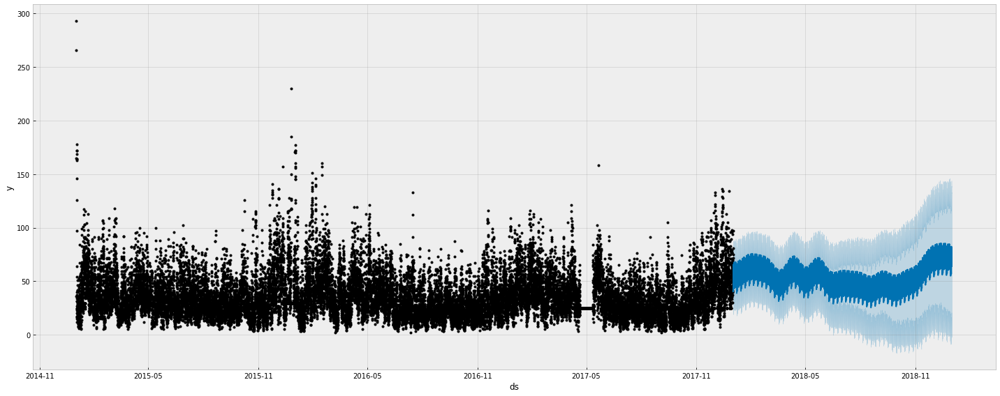

In [11]:
f, ax=plt.subplots(1) #subplot of 1 row... #f es para parámetros de la estructura del gráfico #ax es para crear el plot
f.set_figheight(8)
f.set_figwidth(20)
fig=modelo.plot(pred, ax=ax)

In [70]:
test.ds=pd.to_datetime(test.ds)

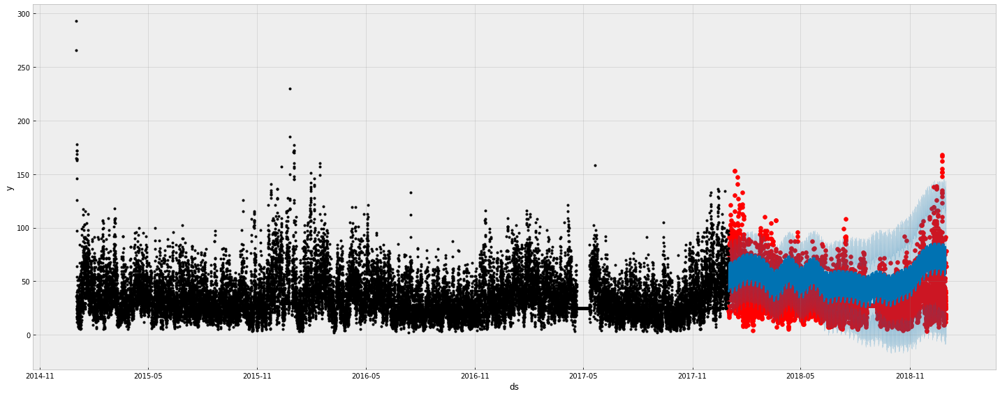

In [13]:
f, ax=plt.subplots(1)
f.set_figheight(8)
f.set_figwidth(20)
ax.scatter(test.ds, test.y, color='r')
fig=modelo.plot(pred, ax)

In [14]:
#Comparando

import plotly.graph_objects as go
fig = go.Figure()
# Add traces
fig.add_trace(go.Scatter(x=test.ds, y=test.y,
                    mode='lines',
                    name='test'))
fig.add_trace(go.Scatter(x=pred.ds, y=pred.yhat,
                    mode='lines',
                    name='pred'))
fig.show()

In [15]:
mean_squared_error(test.y, pred.yhat)**0.5

22.099673026818614

In [16]:
mean_absolute_error(test.y, pred.yhat)

18.404792931449418

In [17]:
def mape(y_true, y_pred):
    y_true, y_pred=np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true-y_pred)/y_true))*100

In [18]:
mape(test.y, pred.yhat)

76.86212637770161

## Modelo B

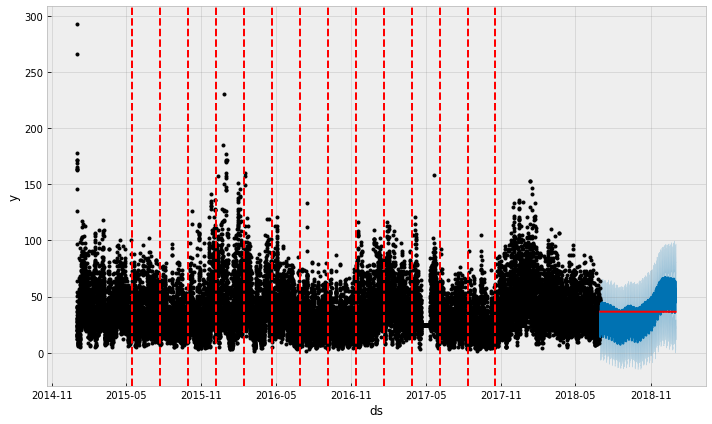

In [83]:
from fbprophet.plot import add_changepoints_to_plot
#ploteando change_pints del modelo A
fig = modelo.plot(pred)
a = add_changepoints_to_plot(fig.gca(), modelo, pred)

#changepoints

* changepoint_prior_scale=0.5
* seasonality_mode por default = additive, ya que no se esperan cambios abrumadores durante el futuro...? la otra opción es multiplicative
* seasonality_prior_scale = 10-25
* yearly_seasonality, weekly_seasonality and daily_seasonality = FALSE y agregar fourier_order: de la pág de towards datascience
* Pa la noche mcmc_samples=500 Markov Chain

In [110]:
modelo=Prophet(n_changepoints=15,
               changepoint_prior_scale=20,
               seasonality_prior_scale = 15,
               ).fit(train)

In [111]:
pred=modelo.predict(test)

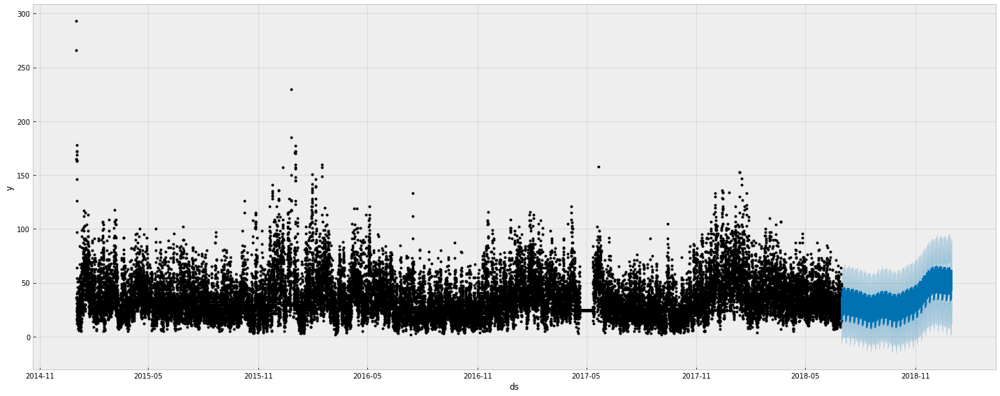

In [112]:
f, ax=plt.subplots(1)
f.set_figheight(8)
f.set_figwidth(20)
fig=modelo.plot(pred, ax=ax)

In [113]:
#Comparando

import plotly.graph_objects as go
fig = go.Figure()
# Add traces
fig.add_trace(go.Scatter(x=test.ds, y=test.y,
                    mode='lines',
                    name='test'))
fig.add_trace(go.Scatter(x=pred.ds, y=pred.yhat,
                    mode='lines',
                    name='pred'))
fig.show()

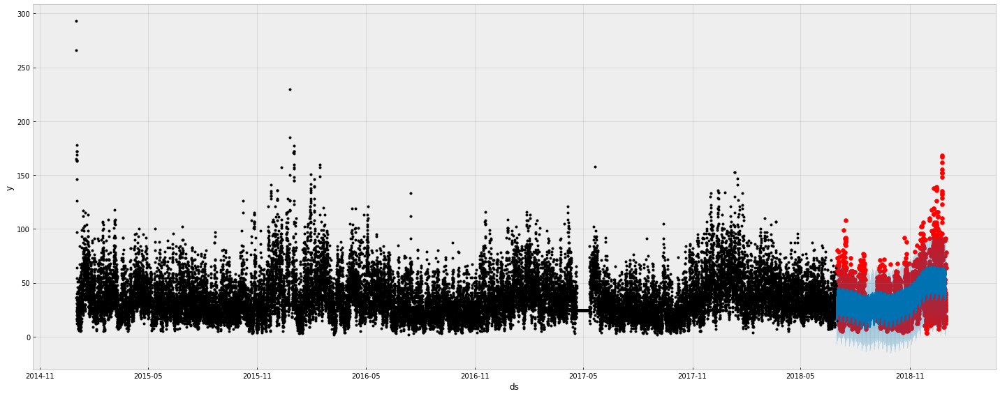

In [114]:
f, ax=plt.subplots(1)
f.set_figheight(8)
f.set_figwidth(20)
ax.scatter(test.ds, test.y, color='r')
fig=modelo.plot(pred, ax)

In [115]:
mean_squared_error(test.y, pred.yhat)**0.5

16.762009810559864

In [116]:
mean_absolute_error(test.y, pred.yhat)

12.047460488174808

In [117]:
mape(test.y, pred.yhat)

44.34869485057188

El MAPE baja más de 30 puntos!!

## Modelo C

In [32]:
modelo=Prophet(n_changepoints=15,
               changepoint_prior_scale=0.65,
               seasonality_prior_scale = 15,
               #interval_width=0.85,
              ).fit(train)

In [33]:
pred=modelo.predict(test)

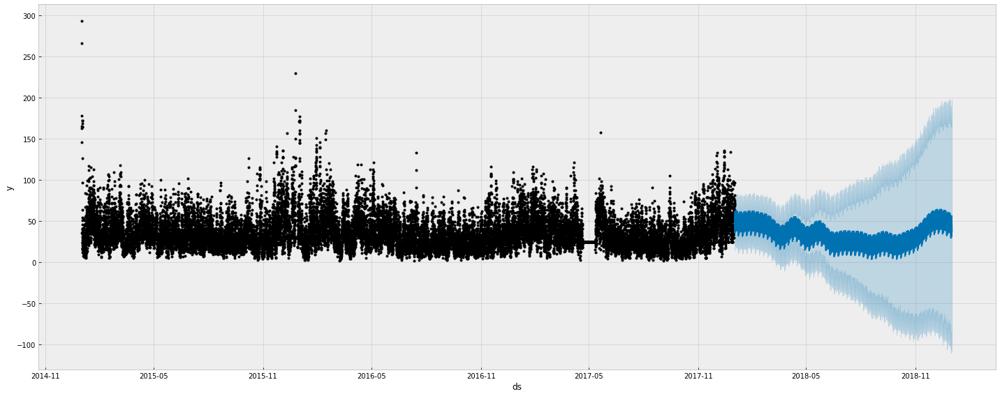

In [34]:
f, ax=plt.subplots(1)
f.set_figheight(8)
f.set_figwidth(20)
fig=modelo.plot(pred, ax=ax)

In [35]:
#Comparando

import plotly.graph_objects as go
fig = go.Figure()
# Add traces
fig.add_trace(go.Scatter(x=test.ds, y=test.y,
                    mode='lines',
                    name='test'))
fig.add_trace(go.Scatter(x=pred.ds, y=pred.yhat,
                    mode='lines',
                    name='pred'))
fig.show()

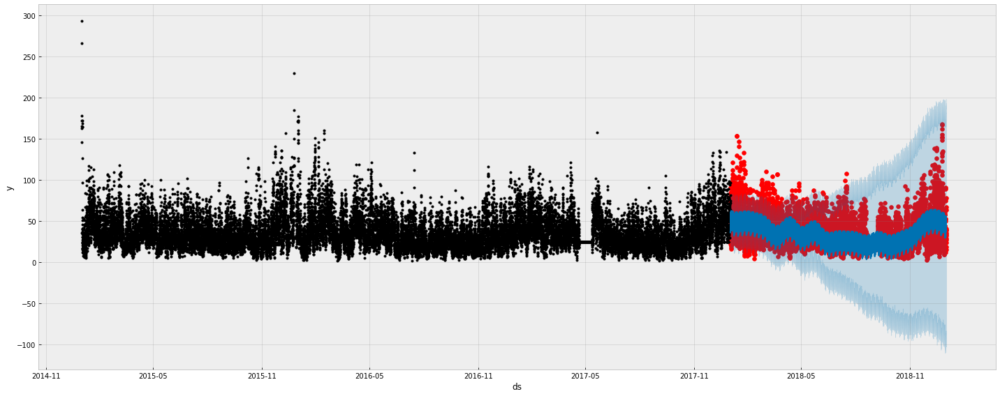

In [36]:
f, ax=plt.subplots(1)
f.set_figheight(8)
f.set_figwidth(20)
ax.scatter(test.ds, test.y, color='r')
fig=modelo.plot(pred, ax)

In [37]:
mean_squared_error(test.y, pred.yhat)**0.5

17.017895875268586

In [38]:
mean_absolute_error(test.y, pred.yhat)

12.655452490839535

In [39]:
mape(test.y, pred.yhat)

38.89982278802535

## Modelo D

In [40]:
modelo=Prophet(changepoint_prior_scale=10,
               seasonality_prior_scale = 15,
               ).fit(train)

pred=modelo.predict(test)

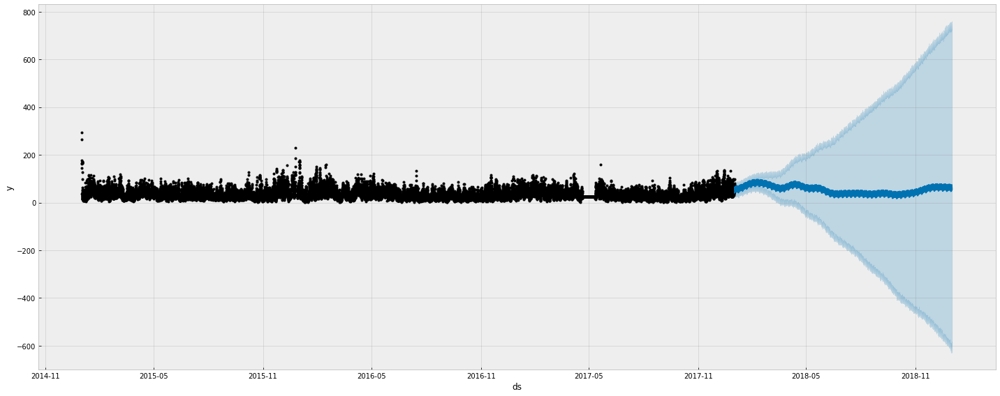

In [41]:
f, ax=plt.subplots(1)
f.set_figheight(8)
f.set_figwidth(20)
fig=modelo.plot(pred, ax=ax)

In [43]:
fig = go.Figure()
# Add traces
fig.add_trace(go.Scatter(x=test.ds, y=test.y,
                    mode='lines',
                    name='test'))
fig.add_trace(go.Scatter(x=pred.ds, y=pred.yhat,
                    mode='lines',
                    name='pred'))
fig.show()

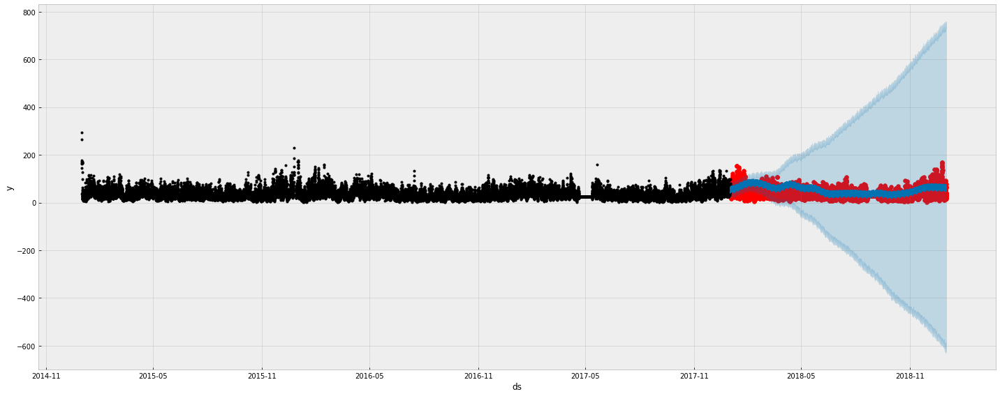

In [44]:
f, ax=plt.subplots(1)
f.set_figheight(8)
f.set_figwidth(20)
ax.scatter(test.ds, test.y, color='r')
fig=modelo.plot(pred, ax)

In [45]:
mean_squared_error(test.y, pred.yhat)**0.5

24.431970109357

In [46]:
mean_absolute_error(test.y, pred.yhat)

19.400566968697

In [47]:
mape(test.y, pred.yhat)

75.0181347605317

El parámetro changepoint_prior_scale es muy alto!

## Modelo E

In [84]:
modelo=Prophet(n_changepoints=15,
               changepoint_prior_scale=.5,
               seasonality_prior_scale = 30,
               ).fit(train)

pred=modelo.predict(test)

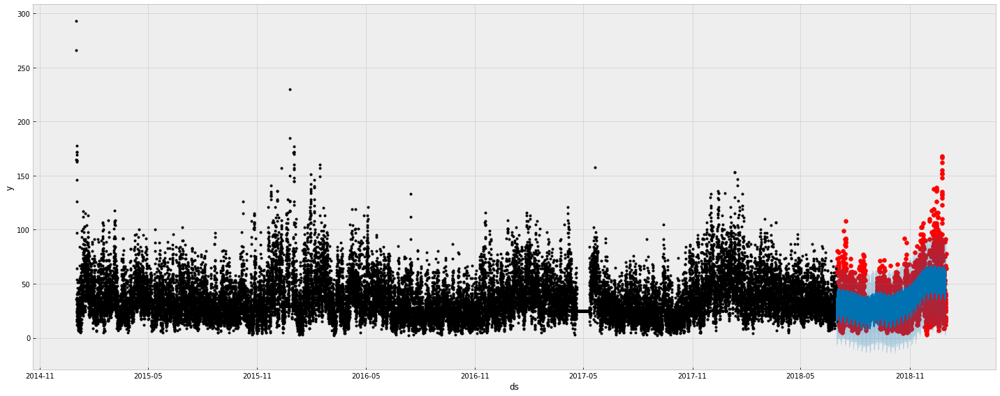

In [85]:
f, ax=plt.subplots(1)
f.set_figheight(8)
f.set_figwidth(20)
ax.scatter(test.ds, test.y, color='r')
fig=modelo.plot(pred, ax)

In [86]:
mean_squared_error(test.y, pred.yhat)**0.5

16.816033231910232

In [87]:
mean_absolute_error(test.y, pred.yhat)

12.139626098127286

In [88]:
mape(test.y, pred.yhat)

45.39288110474697

## Modelo F

In [123]:
modelo=Prophet(n_changepoints=15,
               changepoint_prior_scale=20,
               seasonality_prior_scale=15,
               daily_seasonality=False,
               weekly_seasonality=False,
               yearly_seasonality=False,
               ).add_seasonality(
                name='monhtly',
                period=30.5,
                fourier_order=10
               ).add_seasonality(
                name='daily',
                period=1,
                fourier_order=10
               ).add_seasonality(
                name='weekly',
                period=7,
                fourier_order=15
               ).add_seasonality(
                name='yearly',
                period=365.25,
                fourier_order=30
               ).add_seasonality(
                name='quarterly',
                period=365.25/4,
                fourier_order=10,
                prior_scale=15).fit(train)

pred=modelo.predict(test)

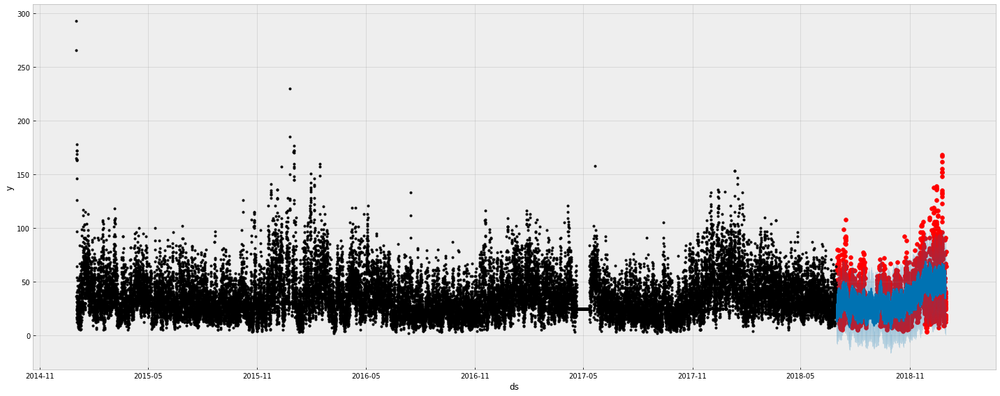

In [124]:
f, ax=plt.subplots(1)
f.set_figheight(8)
f.set_figwidth(20)
ax.scatter(test.ds, test.y, color='r')
fig=modelo.plot(pred, ax)

In [125]:
mean_squared_error(test.y, pred.yhat)**0.5

16.91814906903432

In [126]:
mean_absolute_error(test.y, pred.yhat)

12.280211430525307

In [127]:
mape(test.y, pred.yhat)

44.26622724459713

El RMSE más bajo hasta ahorita